In [ ]:
# default_exp svd

## Imports

In [ ]:
# EXPORT
# --- Must haves ---
import os, sys
sys.path.append('..')
import torch
from torch.utils.data import Dataset, DataLoader
from surrogates4sims.datasets import MantaFlowDataset, getSingleSim, createMantaFlowTrainTest
import numpy as np
import matplotlib.pyplot as plt
from surrogates4sims.utils import rmse, create_movie, convertSimToImage
from tqdm import tqdm
import pickle

In [ ]:
# EXPORT
class MantaFlowSVDDataset(Dataset):
    def __init__(self, 
                 simFrames,
                 svdFile = '/home/widemann1/surrogates4sims/svd_out.npz',
                 numToKeep=np.infty,numComponents=512,transform=None, preprocess=True): 
        
        if '.pkl' in simFrames:
            with open(simFrames,'rb') as fid:
                self.data = pickle.load(fid)
            if numToKeep < len(self.data):
                self.data = self.data[:numToKeep]
        else:
            if type(simFrames) == list:
                self.simFrames = simFrames
            else:
                self.simFrames = glob(os.path.join(simFrames,'*.npz'))
                
            self.numToKeep = numToKeep
            self.transform = transform
            self.svdFile = svdFile
            self.numComponents = numComponents
            self.simLen = 200

            out = np.load(svdFile)
            self.vh = out['arr_2'][:numComponents]

            self.sims = []
            for i in range(len(self.simFrames)//self.simLen):
                sim = getSingleSim(i)
                self.sims.append(sim)

            tmp = []

            if numToKeep < len(self.sims):
                self.sims = self.sims[:numToKeep]

            for sim in tqdm(self.sims):
                coeff_data = []
                for f in sim:
                    X,y = self.loadfile(f)

                    if preprocess:
                        X,y = self.preprocessFcn(X,y)
                    X = X.reshape(-1,1)
                    coeffs = (self.vh@X).squeeze()
                    #print(coeffs.shape)
                    #print(y.shape)
                    coeff_data.append((coeffs,y))

                diff_data = []
                for idx,c in enumerate(coeff_data[:-1]):
                    #print(c)
                    X0,y0 = c
                    X1,y1 = coeff_data[idx+1]
                    X = np.concatenate([X0,y1-y0])
                    #print(X.shape)
                    diff_data.append((X,X1))
                tmp.append(diff_data)

            self.data = [i for sublist in tmp for i in sublist]

    def loadfile(self,fn):
        A = np.load(fn)
        X = A['x'].astype('float32')
        X = np.rollaxis(X,-1)
        y = A['y'].astype('float32')
        return X,y

    def preprocessFcn(self,X,y):
        x_range = 11.953
        X /= x_range
        y_range = [[0.2, 0.8], [0.04, 0.12], [0.0, 199.0]]
        for i, ri in enumerate(y_range):
            y[i] = (y[i]-ri[0]) / (ri[1]-ri[0]) * 2 - 1
        return X,y
    
    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        X,y = self.data[idx]
        return X,y

In [ ]:
tr, te = createMantaFlowTrainTest()
len(tr), len(te)

(19000, 2000)

In [ ]:
mvd = MantaFlowSVDDataset(simFrames=te,numToKeep=3)


100%|██████████| 3/3 [00:03<00:00,  1.12s/it]


In [ ]:
len(mvd)

597

In [ ]:
X,y = mvd[1]
X.shape, y.shape

((515,), (512,))

In [ ]:
mvd = MantaFlowSVDDataset('svd_dataset_test.pkl',numToKeep=100)
len(mvd)

100

In [ ]:
X,y = mvd[1]
X.shape, y.shape

((515,), (512,))

## SVD of the simulation data

This is how I'm computing the svd of the simulation data. Higher dimensional SVD did not work, so I'm going back to 2 dimensional.

In [ ]:
versionName = "SVD"

# Data Directory
dataDirec = '/data/mantaFlowSim/data/smoke_pos21_size5_f200/v'
reverseXY = False 
testSplit = .1
simLen = 200
seed = 1234
numSamplesToKeep = np.infty

## Datasets & Loaders

In [ ]:
trainData, testData = createMantaFlowTrainTest(dataDirec,simLen,testSplit,seed)
print((len(trainData),len(testData)))

(19000, 2000)


In [ ]:
# datasets may be smaller because: numSamplesToKeep 
testDataset = MantaFlowDataset(testData, reverseXY=reverseXY, numToKeep=numSamplesToKeep, AE=False)
trainDataset = MantaFlowDataset(trainData, reverseXY=reverseXY,numToKeep=numSamplesToKeep, AE=False)
len(trainDataset), len(testDataset)

100%|██████████| 19000/19000 [00:34<00:00, 553.05it/s]


(19000, 2000)

In [ ]:
trainDataLoader = DataLoader(dataset=trainDataset, batch_size=len(trainDataset))
testDataLoader = DataLoader(dataset=testDataset, batch_size=len(testDataset))

In [ ]:
X_train, p_train = next(iter(trainDataLoader))

X_train = X_train.numpy()
X_train.shape

(19000, 2, 128, 96)

In [ ]:
from numpy.linalg import svd

## 2D SVD

In [ ]:
X = X_train.reshape(X_train.shape[0],np.prod(X_train.shape[1:]))
X.shape

(19000, 24576)

In [ ]:
u,s,vh = svd(X,full_matrices=False)

In [ ]:
u.shape

(19000, 19000)

In [ ]:
s.shape

(19000,)

In [ ]:
s_cum = np.cumsum(s/np.sum(s))

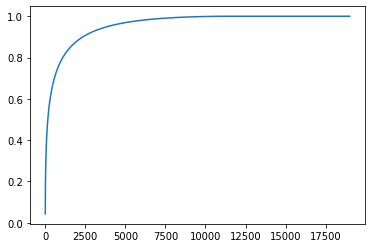

In [ ]:
plt.plot(s_cum)

In [ ]:
s_cum[:10000]

array([0.042866  , 0.08403951, 0.103512  , ..., 0.9987808 , 0.9987824 ,
       0.998784  ], dtype=float32)

In [ ]:
v = np.where(s_cum > .99)[0]
v[0]

7347

In [ ]:
vh.shape

(19000, 24576)

In [ ]:
n = 1000

In [ ]:
X_test = X_test.reshape(X_test.shape[0],np.prod(X_test.shape[1:]))
X_test.shape

(2000, 24576)

In [ ]:
A = X_test[0]
A.shape

(24576,)

In [ ]:
coeffs = vh[:n]@A
coeffs

array([-8.71537440e-03,  7.41006993e-03, -8.22401699e-03,  7.01030903e-03,
        1.42072905e-02, -1.66854560e-02,  2.55656168e-02, -1.47436652e-02,
        1.98472235e-02, -1.81019120e-02, -7.88622536e-03,  1.73236579e-02,
       -1.29617332e-02, -1.41280992e-02, -4.59641538e-04,  1.40260356e-02,
        2.95203216e-02, -2.37700753e-02,  1.76848434e-02, -3.06725083e-03,
       -3.35602625e-03, -5.72300144e-03,  1.99599266e-02, -2.91907713e-02,
       -2.05062758e-02,  7.92562962e-03,  6.85057370e-03, -1.79716628e-02,
        2.43243063e-04,  3.51807429e-03, -2.89145634e-02,  9.19176079e-03,
       -2.69331560e-02, -7.83640891e-03, -1.09706037e-02,  2.94744466e-02,
        2.52953433e-02, -6.58737554e-04, -5.04343864e-03, -2.57440172e-02,
       -2.00727787e-02,  5.51832467e-03, -4.65373881e-03,  8.87118559e-03,
        1.99536681e-02, -1.08243823e-02,  2.12800801e-02, -7.79892958e-04,
        1.48499459e-02,  7.36090960e-03, -1.48752332e-02,  1.35853316e-03,
       -1.83143411e-02, -

In [ ]:
R = np.zeros(A.shape)
for idx, c in enumerate(coeffs):
    R += c*vh[idx]


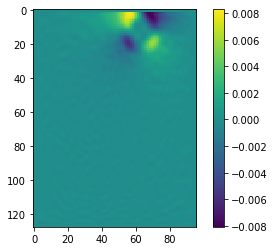

In [ ]:
R = R.reshape(X_train.shape[1:])
plt.imshow(R[0])
plt.colorbar()

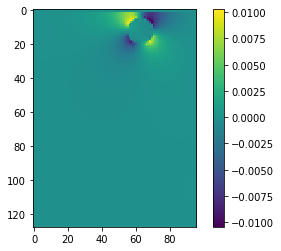

In [ ]:
A = A.reshape(X_train.shape[1:])
plt.imshow(A[0])
plt.colorbar()

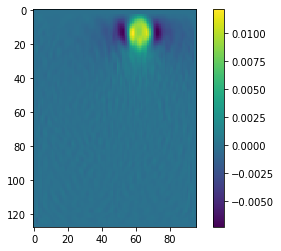

In [ ]:
plt.imshow(R[1])
plt.colorbar()

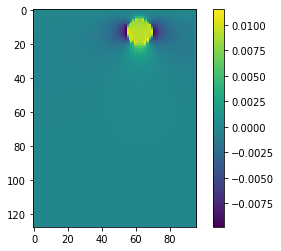

In [ ]:
plt.imshow(A[1])
plt.colorbar()

In [ ]:
#np.savez('svd_out.npz', u,s,vh)

In [ ]:
def reconFrame(frame,numComp=512):
    coeffs = vh[:numComp]@frame
    R = np.zeros(frame.shape)
    for idx, c in enumerate(coeffs):
        R += c*vh[idx]
    R = R.reshape(X_train.shape[1:])
    return R


In [ ]:
B = reconFrame(X_test[3])
B.shape

(2, 128, 96)

In [ ]:
simVizIndex = 0
simData = getSingleSim(sim=simVizIndex,dataDirec=testData)
simDataset = MantaFlowDataset(simData, reverseXY=reverseXY, numToKeep=numSamplesToKeep, AE=False)
simDataLoader = DataLoader(simDataset,batch_size=200)

100%|██████████| 200/200 [00:00<00:00, 564.36it/s]


In [ ]:
simData,p = next(iter(simDataLoader))
simData = simData.detach().numpy()

In [ ]:
S = simData.reshape(200,np.prod(simData.shape[1:]))
S.shape

(200, 24576)

In [ ]:
R = list(map(lambda x: reconFrame(x), S))

In [ ]:
B = []
for r in R:
    B.append(r.reshape(2,128,96))

In [ ]:
Surr_X = np.stack(B)
Surr_X.shape

(200, 2, 128, 96)

In [ ]:
simData.shape

(200, 2, 128, 96)

In [ ]:
from numpy.linalg import norm

In [ ]:
rel_error = norm(simData - Surr_X)/norm(simData)
rel_error

0.09615749353731336

In [ ]:
R_err = []
for a,b in zip(simData,Surr_X):
    R_err.append(norm(a - b)/norm(a))


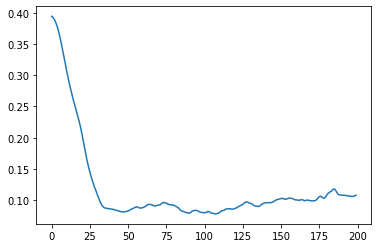

In [ ]:
plt.plot(R_err)
plt.show()

In [ ]:
d = (simData -Surr_X)**2
d = np.mean(d)
d = np.sqrt(d)
d

0.012809006930829358

In [ ]:
Surr_X_img = convertSimToImage(torch.from_numpy(Surr_X))

In [ ]:
simData_img = convertSimToImage(torch.from_numpy(simData))

In [ ]:
out = np.concatenate([simData_img,Surr_X_img],axis=3)
out.shape

(200, 3, 128, 192)

MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


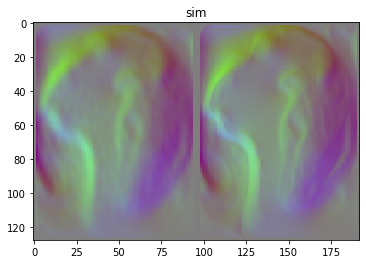

In [ ]:
outGif = '{}.gif'.format('svd')
create_movie(out,outfile=outGif)

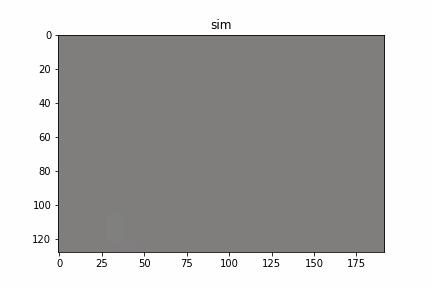

In [ ]:
from IPython.display import Image
Image(filename=outGif)

In [ ]:
diff_img = convertSimToImage(torch.abs(torch.from_numpy(simData)-torch.from_numpy(Surr_X)))

MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


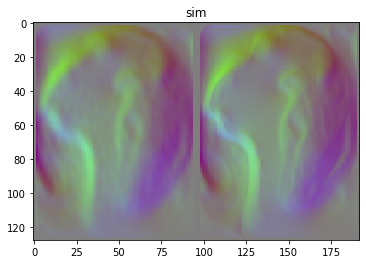

In [ ]:
outGif = '{}.gif'.format('svd_err')
create_movie(out,outfile=outGif)

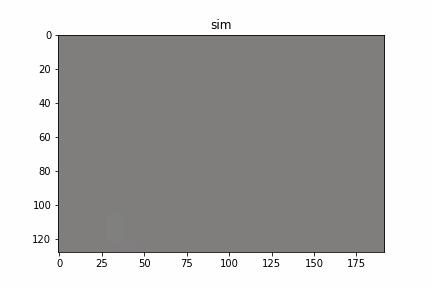

In [ ]:
from IPython.display import Image
Image(filename=outGif)

## Scratch: Not working Higher Dimensional SVD

In [ ]:
U, S, Vh = svd(X_train)

In [ ]:
U.shape

(19000, 2, 128, 128)

In [ ]:
S.shape

(19000, 2, 96)

In [ ]:
Vh.shape

(19000, 2, 96, 96)

In [ ]:
np.allclose(X_train, np.matmul(U[..., :96] * S[..., None, :], Vh))

False

In [ ]:
np.allclose(X_train, np.matmul(U[..., :96], S[..., None] * Vh))

False

In [ ]:
d = np.abs(X_train - np.matmul(U[..., :96] * S[..., None, :], Vh))

In [ ]:
d.max()

8.34465e-07

In [ ]:
d.min()

0.0

In [ ]:
us = U[..., :96] * S[..., None, :]
us.shape

(19000, 2, 128, 96)

In [ ]:
S[0,0,:], np.sum(S[0,0,:])

(array([1.00280404e-01, 2.64233686e-02, 1.64543074e-02, 1.23938341e-02,
        1.00841252e-02, 6.55598240e-03, 4.47598426e-03, 4.17897524e-03,
        3.92528903e-03, 3.53876618e-03, 2.76460685e-03, 2.34282366e-03,
        1.31727487e-03, 8.07182980e-04, 6.79959834e-04, 3.62228951e-04,
        1.87964542e-04, 1.76886664e-04, 1.16533025e-04, 5.03277661e-05,
        3.50422415e-05, 2.62387166e-05, 2.45606388e-05, 2.36848282e-05,
        1.52799712e-05, 1.46815537e-05, 1.29215032e-05, 1.18052885e-05,
        1.09480306e-05, 1.03282455e-05, 8.34969251e-06, 8.25428287e-06,
        7.56448389e-06, 7.33240540e-06, 6.97534369e-06, 6.70461986e-06,
        6.29512442e-06, 6.13352722e-06, 6.08680557e-06, 5.84969166e-06,
        5.56114264e-06, 5.54227427e-06, 5.28975170e-06, 5.09525989e-06,
        4.80266317e-06, 4.55661393e-06, 4.36711343e-06, 4.13586940e-06,
        4.13413272e-06, 3.97321901e-06, 3.74817364e-06, 3.51872313e-06,
        3.49029119e-06, 3.35116829e-06, 3.16540013e-06, 3.016895

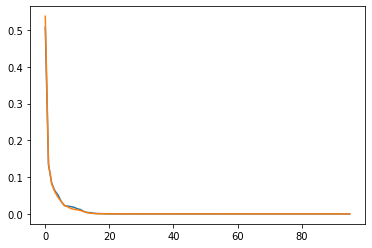

In [ ]:
plt.plot(S[0,0,:]/np.sum(S[0,0,:]))
plt.plot(S[0,1,:]/np.sum(S[0,1,:]))

In [ ]:
c = S[0,1,:]/np.sum(S[0,1,:])
c

array([5.3739220e-01, 1.3708265e-01, 8.1127286e-02, 5.9829101e-02,
       4.4801362e-02, 3.3406183e-02, 2.2695083e-02, 1.9196415e-02,
       1.4623605e-02, 1.2465459e-02, 1.1177907e-02, 9.2763286e-03,
       6.3209827e-03, 3.5635566e-03, 2.0661745e-03, 1.3908186e-03,
       7.7758095e-04, 5.5260229e-04, 4.3518035e-04, 2.5546658e-04,
       1.6854228e-04, 1.3668611e-04, 1.1168382e-04, 9.4924530e-05,
       7.9790654e-05, 7.3153074e-05, 6.5163098e-05, 5.8032256e-05,
       5.0893665e-05, 4.4771870e-05, 4.1854579e-05, 4.0054063e-05,
       3.1458909e-05, 2.8482722e-05, 2.7823238e-05, 2.6730049e-05,
       2.5087695e-05, 2.4098439e-05, 2.3030501e-05, 2.2405646e-05,
       2.0707308e-05, 2.0435893e-05, 1.9990806e-05, 1.9296916e-05,
       1.8269340e-05, 1.6811971e-05, 1.6157423e-05, 1.5450056e-05,
       1.5115525e-05, 1.4314940e-05, 1.3256423e-05, 1.2935786e-05,
       1.2497442e-05, 1.1853603e-05, 1.1250945e-05, 1.0549341e-05,
       9.6536787e-06, 9.4439793e-06, 8.9326795e-06, 8.3947771e

In [ ]:
np.cumsum(c)

array([0.5373922 , 0.67447484, 0.7556021 , 0.81543124, 0.8602326 ,
       0.8936388 , 0.91633385, 0.93553025, 0.9501538 , 0.9626193 ,
       0.9737972 , 0.98307353, 0.9893945 , 0.99295807, 0.99502426,
       0.9964151 , 0.9971927 , 0.9977453 , 0.99818045, 0.9984359 ,
       0.9986045 , 0.99874115, 0.99885285, 0.9989478 , 0.9990276 ,
       0.99910074, 0.9991659 , 0.99922395, 0.99927485, 0.9993196 ,
       0.99936146, 0.9994015 , 0.999433  , 0.9994615 , 0.9994893 ,
       0.999516  , 0.9995411 , 0.9995652 , 0.9995882 , 0.9996106 ,
       0.9996313 , 0.99965173, 0.9996717 , 0.999691  , 0.9997093 ,
       0.9997261 , 0.99974227, 0.9997577 , 0.99977285, 0.99978715,
       0.9998004 , 0.9998133 , 0.99982584, 0.9998377 , 0.99984896,
       0.9998595 , 0.99986917, 0.9998786 , 0.9998875 , 0.99989593,
       0.9999039 , 0.9999112 , 0.9999179 , 0.9999243 , 0.99993056,
       0.99993664, 0.9999422 , 0.99994737, 0.9999525 , 0.9999573 ,
       0.99996185, 0.99996614, 0.9999701 , 0.9999736 , 0.99997

In [ ]:
X_test, p_test = next(iter(testDataLoader))

X_test = X_test.numpy()
X_test.shape

(2000, 2, 128, 96)

In [ ]:
n=5
A = us[:n]*X_test[1]

In [ ]:
coeffs = np.array([np.sum(a) for a in A])
#coeffs = coeffs.reshape(1,n)
coeffs.shape

(5,)

In [ ]:
def frameRecon(frame,numComp=5000):
    A = us[:numComp]*X_test[1]
    coeffs = np.array([np.sum(a) for a in A])
    R =  np.zeros(us.shape[1:])
    for idx,c in enumerate(coeffs):
        R += c*us[idx]
    return R

In [ ]:
R = frameRecon(X_test[3],5)
R.shape

(2, 128, 96)

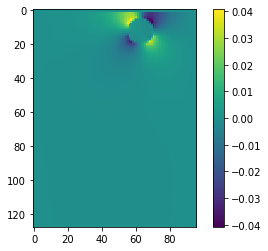

In [ ]:
plt.imshow(X_test[3,0,:,:])
plt.colorbar()

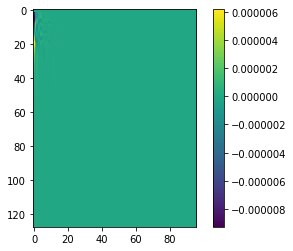

In [ ]:
plt.imshow(R[0,:,:])
plt.colorbar()

In [ ]:
us[:n]*coeffs

ValueError: operands could not be broadcast together with shapes (5,2,128,96) (5,) 

In [ ]:
X_train.shape

(19000, 2, 128, 96)

## Model

Currently, the models need to take data to be built. It's kinda weird. I may look into fix this later. 

In [ ]:
X,p = next(iter(trainDataLoader))
X = X.to(device)
p = p.to(device)
X.shape, p.shape

(torch.Size([8, 2, 128, 96]), torch.Size([8, 3]))

In [ ]:
model = AE_xhat_zV2(X, filters, latentDim, num_conv, repeat, 
                 skip_connection, stack, conv_k=3, last_k=3, 
                 act=nn.LeakyReLU(), return_z=True, stream=createStreamFcn, device=device)

if len(gpu_ids.split(',')) > 1:
    model = nn.DataParallel(model)

In [ ]:
def printNumModelParams(model):
    layers_req_grad = 0
    tot_layers = 0

    params_req_grad = 0
    tot_params = 0

    for param in model.named_parameters():
        #print(param[0])
        if (param[1].requires_grad):
            layers_req_grad += 1
            params_req_grad += param[1].nelement()
        tot_layers += 1
        tot_params += param[1].nelement()
    print("{0:,} layers require gradients (unfrozen) out of {1:,} layers".format(layers_req_grad, tot_layers))
    print("{0:,} parameters require gradients (unfrozen) out of {1:,} parameters".format(params_req_grad, tot_params))
    

In [ ]:
printNumModelParams(model)

154 layers require gradients (unfrozen) out of 154 layers
15,409,410 parameters require gradients (unfrozen) out of 15,409,410 parameters


In [ ]:
Xhat,z = model(X)
Xhat.shape, z.shape

(torch.Size([8, 2, 128, 96]), torch.Size([8, 512]))

## Loss Function

In [ ]:
def L1_loss(pred, target):
    return torch.mean(torch.abs(pred - target))


def jacobian_loss(pred, target, device='cpu'):
    return L1_loss(jacobian(pred, device), jacobian(target, device))


def curl_loss(pred, target, device):
    return L1_loss(curl(pred, device), curl(target, device))


L = nn.MSELoss()


def p_loss(pred, target):
    return L(pred[:, -target.shape[1]:], target)


def loss(pred, target, device):
    
    if createStreamFcn:
        pred = stream2uv(pred, device)
        
    L1 = L1_loss(pred, target)
    Lj = 0
    if doJacobian:
        Lj = jacobian_loss(pred, target, device)
        
    return L1 + Lj

In [ ]:
pred = stream2uv(Xhat,device)
pred.shape

torch.Size([8, 2, 128, 96])

In [ ]:
loss(pred,X,device)

tensor(0.0743, device='cuda:0', grad_fn=<AddBackward0>)

In [ ]:
p_loss(z,p)

tensor(0.2966, device='cuda:0', grad_fn=<MseLossBackward>)

## Set LR

In [ ]:
if findLRs and (len(gpu_ids.split(','))==1): # doesn't work for multigpu???
    from copy import deepcopy
    model.return_z = False
    ae_dataset = deepcopy(trainDataset)
    ae_dataset.AE = True # only output (X,X), i.e. no p.
    dataLoader = DataLoader(ae_dataset,batch_size=bz)
    opt = create_opt(1e-7,model)
    find_lr(model,opt,L,device,dataLoader)
    model.return_z = True

In [ ]:
max_lr = .00001
start_lr = 5*max_lr/10
opt = create_opt(max_lr,model)
#opt = torch.optim.Adam(model.parameters(),lr=start_lr,betas=(.5,.999))
lr_scheduler = create_one_cycle(opt,max_lr,epochs,trainDataLoader)

In [ ]:
versionName = versionName + '_lr{}'.format(str(max_lr))

## Train

In [ ]:
try:
    os.mkdir(cps)
except:
    print("checkpoints directory already exists :)")

checkpoints directory already exists :)


In [ ]:
# create a summary writer.
train_writer = SummaryWriter(os.path.join(tensorboard_direc, versionName,'train'))
test_writer = SummaryWriter(os.path.join(tensorboard_direc, versionName,'valid'))
tensorboard_recorder_step = 0
total_steps = 0

In [ ]:
writeMessage('---------- Started Training ----------', versionName)
bestLoss = np.infty

for epoch in tqdm(range(1, epochs+1)):  # loop over the dataset multiple times
    
    writeMessage("--- Epoch {0}/{1} ---".format(epoch, epochs), versionName)
    
    model.train()
    trainLoss, tensorboard_recorder_step, total_steps = trainEpoch(trainDataLoader, 
                                                                   train_writer, model, opt, p_loss, loss,
                                                                   rmse, lr_scheduler, 
                                                                   tensorboard_rate, device,
                                                                   tensorboard_recorder_step, total_steps)
    
    writeMessage("trainLoss: {:.4e}".format(trainLoss),versionName)
    model.eval()
    valLoss = validEpoch(testDataLoader, test_writer, model, p_loss, loss, rmse, device, tensorboard_recorder_step)
    writeMessage("valLoss: {:.4e}".format(valLoss),versionName)
    
    # checkpoint progress
    if valLoss < bestLoss:
        bestLoss = valLoss
        writeMessage("Better valLoss: {:.4e}, Saving models...".format(bestLoss),versionName)
        torch.save(model.state_dict(), os.path.join(cps,versionName))

    if trainLoss > 100:
        break
writeMessage('---------- Finished Training ----------', versionName)

  0%|          | 0/200 [00:00<?, ?it/s]

---------- Started Training ----------
--- Epoch 1/200 ---
trainLoss: 3.0849e-01
valLoss: 3.4998e-01
Better valLoss: 3.4998e-01, Saving models...


  0%|          | 1/200 [00:03<12:23,  3.74s/it]

--- Epoch 2/200 ---
trainLoss: 2.9984e-01
valLoss: 3.4758e-01
Better valLoss: 3.4758e-01, Saving models...


  1%|          | 2/200 [00:11<16:16,  4.93s/it]

--- Epoch 3/200 ---
trainLoss: 2.9141e-01
valLoss: 3.4828e-01


  2%|▏         | 3/200 [00:13<12:59,  3.96s/it]

--- Epoch 4/200 ---
trainLoss: 3.1225e-01


  2%|▏         | 4/200 [00:15<11:05,  3.40s/it]

valLoss: 3.5331e-01
--- Epoch 5/200 ---
trainLoss: 2.7308e-01
valLoss: 3.6303e-01


  2%|▎         | 5/200 [00:17<09:54,  3.05s/it]

--- Epoch 6/200 ---


  3%|▎         | 6/200 [00:18<07:30,  2.32s/it]

trainLoss: 3.1989e-01
valLoss: 3.7406e-01
--- Epoch 7/200 ---
trainLoss: 2.4897e-01


  4%|▎         | 7/200 [00:19<06:33,  2.04s/it]

valLoss: 3.7988e-01
--- Epoch 8/200 ---
trainLoss: 2.8847e-01
valLoss: 3.8402e-01


  4%|▍         | 8/200 [00:20<05:16,  1.65s/it]

--- Epoch 9/200 ---
trainLoss: 2.1712e-01
valLoss: 3.8555e-01


  4%|▍         | 9/200 [00:23<06:29,  2.04s/it]

--- Epoch 10/200 ---


  5%|▌         | 10/200 [00:23<05:06,  1.61s/it]

trainLoss: 2.1455e-01
valLoss: 3.8027e-01
--- Epoch 11/200 ---


  6%|▌         | 11/200 [00:24<04:07,  1.31s/it]

trainLoss: 2.3197e-01
valLoss: 3.6903e-01
--- Epoch 12/200 ---
trainLoss: 1.5070e-01


  6%|▌         | 12/200 [00:25<04:16,  1.36s/it]

valLoss: 3.6626e-01
--- Epoch 13/200 ---
trainLoss: 1.5282e-01
valLoss: 3.6592e-01


  6%|▋         | 13/200 [00:27<04:54,  1.58s/it]

--- Epoch 14/200 ---
trainLoss: 1.1979e-01
valLoss: 3.4745e-01
Better valLoss: 3.4745e-01, Saving models...


  7%|▋         | 14/200 [00:32<07:32,  2.43s/it]

--- Epoch 15/200 ---
trainLoss: 9.9395e-02
valLoss: 3.2590e-01
Better valLoss: 3.2590e-01, Saving models...


  8%|▊         | 15/200 [00:42<14:16,  4.63s/it]

--- Epoch 16/200 ---
trainLoss: 9.9310e-02
valLoss: 3.0663e-01
Better valLoss: 3.0663e-01, Saving models...


  8%|▊         | 16/200 [00:48<15:38,  5.10s/it]

--- Epoch 17/200 ---
trainLoss: 1.0996e-01
valLoss: 2.8362e-01
Better valLoss: 2.8362e-01, Saving models...


  8%|▊         | 17/200 [00:56<17:56,  5.88s/it]

--- Epoch 18/200 ---
trainLoss: 8.4906e-02
valLoss: 2.5427e-01
Better valLoss: 2.5427e-01, Saving models...


  9%|▉         | 18/200 [01:00<16:59,  5.60s/it]

--- Epoch 19/200 ---
trainLoss: 9.8870e-02
valLoss: 2.1279e-01
Better valLoss: 2.1279e-01, Saving models...


 10%|▉         | 19/200 [01:05<16:21,  5.42s/it]

--- Epoch 20/200 ---
trainLoss: 5.8624e-02
valLoss: 1.8331e-01
Better valLoss: 1.8331e-01, Saving models...


 10%|█         | 20/200 [01:10<15:10,  5.06s/it]

--- Epoch 21/200 ---
trainLoss: 9.1049e-02
valLoss: 1.4457e-01
Better valLoss: 1.4457e-01, Saving models...


 10%|█         | 21/200 [01:16<16:00,  5.37s/it]

--- Epoch 22/200 ---
trainLoss: 6.8244e-02
valLoss: 1.1021e-01
Better valLoss: 1.1021e-01, Saving models...


 11%|█         | 22/200 [01:20<14:52,  5.02s/it]

--- Epoch 23/200 ---
trainLoss: 6.4996e-02
valLoss: 8.7876e-02
Better valLoss: 8.7876e-02, Saving models...


 12%|█▏        | 23/200 [01:26<15:30,  5.26s/it]

--- Epoch 24/200 ---
trainLoss: 5.0446e-02
valLoss: 7.6088e-02
Better valLoss: 7.6088e-02, Saving models...


 12%|█▏        | 24/200 [01:31<15:24,  5.25s/it]

--- Epoch 25/200 ---
trainLoss: 4.0702e-02
valLoss: 6.7283e-02
Better valLoss: 6.7283e-02, Saving models...


 12%|█▎        | 25/200 [01:35<14:26,  4.95s/it]

--- Epoch 26/200 ---
trainLoss: 4.1015e-02
valLoss: 6.4424e-02
Better valLoss: 6.4424e-02, Saving models...


 13%|█▎        | 26/200 [01:40<14:05,  4.86s/it]

--- Epoch 27/200 ---
trainLoss: 3.4755e-02
valLoss: 6.2924e-02
Better valLoss: 6.2924e-02, Saving models...


 14%|█▎        | 27/200 [01:45<13:49,  4.79s/it]

--- Epoch 28/200 ---
trainLoss: 3.2272e-02
valLoss: 6.1811e-02
Better valLoss: 6.1811e-02, Saving models...


 14%|█▍        | 28/200 [01:48<12:55,  4.51s/it]

--- Epoch 29/200 ---
trainLoss: 2.8419e-02
valLoss: 5.3685e-02
Better valLoss: 5.3685e-02, Saving models...


 14%|█▍        | 29/200 [01:54<13:54,  4.88s/it]

--- Epoch 30/200 ---
trainLoss: 2.9831e-02
valLoss: 4.7299e-02
Better valLoss: 4.7299e-02, Saving models...


 15%|█▌        | 30/200 [01:59<13:39,  4.82s/it]

--- Epoch 31/200 ---
trainLoss: 2.5828e-02
valLoss: 4.4918e-02
Better valLoss: 4.4918e-02, Saving models...


 16%|█▌        | 31/200 [02:04<13:47,  4.90s/it]

--- Epoch 32/200 ---
trainLoss: 2.3423e-02
valLoss: 3.8455e-02
Better valLoss: 3.8455e-02, Saving models...


 16%|█▌        | 32/200 [02:11<15:29,  5.53s/it]

--- Epoch 33/200 ---
trainLoss: 2.4356e-02


 16%|█▋        | 33/200 [02:13<12:22,  4.45s/it]

valLoss: 3.8600e-02
--- Epoch 34/200 ---
trainLoss: 2.0783e-02
valLoss: 3.8125e-02
Better valLoss: 3.8125e-02, Saving models...


 17%|█▋        | 34/200 [02:20<14:30,  5.24s/it]

--- Epoch 35/200 ---
trainLoss: 1.8891e-02
valLoss: 3.9623e-02


 18%|█▊        | 35/200 [02:23<12:31,  4.55s/it]

--- Epoch 36/200 ---
trainLoss: 1.8582e-02
valLoss: 3.5833e-02
Better valLoss: 3.5833e-02, Saving models...


 18%|█▊        | 36/200 [02:27<12:03,  4.41s/it]

--- Epoch 37/200 ---
trainLoss: 1.5680e-02
valLoss: 3.3758e-02
Better valLoss: 3.3758e-02, Saving models...


 18%|█▊        | 37/200 [02:32<12:19,  4.54s/it]

--- Epoch 38/200 ---
trainLoss: 1.8733e-02
valLoss: 3.3674e-02
Better valLoss: 3.3674e-02, Saving models...


 19%|█▉        | 38/200 [02:37<12:57,  4.80s/it]

--- Epoch 39/200 ---
trainLoss: 1.4432e-02
valLoss: 2.9673e-02
Better valLoss: 2.9673e-02, Saving models...


 20%|█▉        | 39/200 [02:42<12:41,  4.73s/it]

--- Epoch 40/200 ---
trainLoss: 1.5269e-02
valLoss: 2.8466e-02
Better valLoss: 2.8466e-02, Saving models...


 20%|██        | 40/200 [02:44<10:57,  4.11s/it]

--- Epoch 41/200 ---
trainLoss: 1.5121e-02
valLoss: 2.5938e-02
Better valLoss: 2.5938e-02, Saving models...


 20%|██        | 41/200 [02:52<13:44,  5.18s/it]

--- Epoch 42/200 ---
trainLoss: 1.3517e-02
valLoss: 2.3838e-02
Better valLoss: 2.3838e-02, Saving models...


 21%|██        | 42/200 [02:59<14:46,  5.61s/it]

--- Epoch 43/200 ---
trainLoss: 1.3420e-02
valLoss: 2.2046e-02
Better valLoss: 2.2046e-02, Saving models...


 22%|██▏       | 43/200 [03:05<14:54,  5.70s/it]

--- Epoch 44/200 ---
trainLoss: 1.1378e-02


 22%|██▏       | 44/200 [03:07<11:58,  4.61s/it]

valLoss: 2.3430e-02
--- Epoch 45/200 ---


 22%|██▎       | 45/200 [03:07<08:52,  3.43s/it]

trainLoss: 1.4637e-02
valLoss: 2.2346e-02
--- Epoch 46/200 ---
trainLoss: 1.1449e-02
valLoss: 2.0248e-02
Better valLoss: 2.0248e-02, Saving models...


 23%|██▎       | 46/200 [03:12<10:00,  3.90s/it]

--- Epoch 47/200 ---
trainLoss: 1.1474e-02


 24%|██▎       | 47/200 [03:15<08:36,  3.37s/it]

valLoss: 2.0681e-02
--- Epoch 48/200 ---
trainLoss: 1.0768e-02


 24%|██▍       | 48/200 [03:17<07:39,  3.02s/it]

valLoss: 2.4056e-02
--- Epoch 49/200 ---


 24%|██▍       | 49/200 [03:17<05:48,  2.31s/it]

trainLoss: 1.0334e-02
valLoss: 2.2184e-02
--- Epoch 50/200 ---
trainLoss: 1.0059e-02
valLoss: 2.1422e-02


 25%|██▌       | 50/200 [03:19<05:17,  2.11s/it]

--- Epoch 51/200 ---
trainLoss: 9.5599e-03
valLoss: 2.2612e-02


 26%|██▌       | 51/200 [03:22<05:47,  2.33s/it]

--- Epoch 52/200 ---
trainLoss: 1.1391e-02
valLoss: 2.2174e-02


 26%|██▌       | 52/200 [03:23<04:31,  1.83s/it]

--- Epoch 53/200 ---
trainLoss: 1.1114e-02


 26%|██▋       | 53/200 [03:24<04:11,  1.71s/it]

valLoss: 2.1475e-02
--- Epoch 54/200 ---
trainLoss: 1.0434e-02
valLoss: 2.0098e-02
Better valLoss: 2.0098e-02, Saving models...


 27%|██▋       | 54/200 [03:27<04:58,  2.04s/it]

--- Epoch 55/200 ---
trainLoss: 9.3258e-03


 28%|██▊       | 55/200 [03:29<05:03,  2.09s/it]

valLoss: 2.2455e-02
--- Epoch 56/200 ---


 28%|██▊       | 56/200 [03:30<03:57,  1.65s/it]

trainLoss: 8.2573e-03
valLoss: 2.1683e-02
--- Epoch 57/200 ---
trainLoss: 8.7689e-03
valLoss: 2.2106e-02


 28%|██▊       | 57/200 [03:31<04:04,  1.71s/it]

--- Epoch 58/200 ---
trainLoss: 9.0767e-03


 29%|██▉       | 58/200 [03:32<03:31,  1.49s/it]

valLoss: 2.6196e-02
--- Epoch 59/200 ---


 30%|██▉       | 59/200 [03:34<03:51,  1.64s/it]

trainLoss: 8.5960e-03
valLoss: 2.6943e-02
--- Epoch 60/200 ---
trainLoss: 1.0023e-02


 30%|███       | 60/200 [03:36<03:57,  1.70s/it]

valLoss: 2.4243e-02
--- Epoch 61/200 ---
trainLoss: 8.7112e-03


 30%|███       | 61/200 [03:37<03:18,  1.43s/it]

valLoss: 2.3068e-02
--- Epoch 62/200 ---
trainLoss: 9.3243e-03


 31%|███       | 62/200 [03:39<03:24,  1.48s/it]

valLoss: 2.1537e-02
--- Epoch 63/200 ---
trainLoss: 9.1652e-03
valLoss: 1.9913e-02
Better valLoss: 1.9913e-02, Saving models...


 32%|███▏      | 63/200 [03:45<06:27,  2.83s/it]

--- Epoch 64/200 ---


 32%|███▏      | 64/200 [03:45<04:55,  2.17s/it]

trainLoss: 9.0511e-03
valLoss: 2.3082e-02
--- Epoch 65/200 ---


 32%|███▎      | 65/200 [03:46<03:50,  1.71s/it]

trainLoss: 8.8479e-03
valLoss: 2.1633e-02
--- Epoch 66/200 ---
trainLoss: 6.9858e-03


 33%|███▎      | 66/200 [03:47<03:08,  1.41s/it]

valLoss: 2.3513e-02
--- Epoch 67/200 ---


 34%|███▎      | 67/200 [03:47<02:36,  1.17s/it]

trainLoss: 1.0773e-02
valLoss: 2.5160e-02
--- Epoch 68/200 ---
trainLoss: 8.5677e-03


 34%|███▍      | 68/200 [03:50<03:27,  1.57s/it]

valLoss: 2.3925e-02
--- Epoch 69/200 ---
trainLoss: 8.9527e-03


 34%|███▍      | 69/200 [03:52<03:33,  1.63s/it]

valLoss: 2.2222e-02
--- Epoch 70/200 ---


 35%|███▌      | 70/200 [03:52<02:52,  1.33s/it]

trainLoss: 6.6282e-03
valLoss: 2.1717e-02
--- Epoch 71/200 ---


 36%|███▌      | 71/200 [03:53<02:23,  1.12s/it]

trainLoss: 9.2442e-03
valLoss: 2.4813e-02
--- Epoch 72/200 ---
trainLoss: 8.2486e-03


 36%|███▌      | 72/200 [03:53<02:05,  1.02it/s]

valLoss: 2.1332e-02
--- Epoch 73/200 ---


 36%|███▋      | 73/200 [03:54<01:50,  1.15it/s]

trainLoss: 7.5887e-03
valLoss: 2.0811e-02
--- Epoch 74/200 ---
trainLoss: 8.6829e-03
valLoss: 1.7972e-02
Better valLoss: 1.7972e-02, Saving models...


 37%|███▋      | 74/200 [03:55<01:48,  1.16it/s]

--- Epoch 75/200 ---


 38%|███▊      | 75/200 [03:56<01:39,  1.26it/s]

trainLoss: 8.5414e-03
valLoss: 2.1274e-02
--- Epoch 76/200 ---


 38%|███▊      | 76/200 [03:56<01:31,  1.36it/s]

trainLoss: 8.4441e-03
valLoss: 1.9605e-02
--- Epoch 77/200 ---


 38%|███▊      | 77/200 [03:57<01:25,  1.43it/s]

trainLoss: 9.5576e-03
valLoss: 1.8838e-02
--- Epoch 78/200 ---


 39%|███▉      | 78/200 [03:57<01:21,  1.49it/s]

trainLoss: 6.9089e-03
valLoss: 1.8718e-02
--- Epoch 79/200 ---


 40%|███▉      | 79/200 [03:58<01:20,  1.51it/s]

trainLoss: 8.8872e-03
valLoss: 1.9249e-02
--- Epoch 80/200 ---


 40%|████      | 80/200 [03:59<01:17,  1.55it/s]

trainLoss: 6.4385e-03
valLoss: 1.9249e-02
--- Epoch 81/200 ---


 40%|████      | 81/200 [03:59<01:15,  1.57it/s]

trainLoss: 6.0730e-03
valLoss: 2.0188e-02
--- Epoch 82/200 ---


 41%|████      | 82/200 [04:00<01:14,  1.58it/s]

trainLoss: 9.1022e-03
valLoss: 2.1657e-02
--- Epoch 83/200 ---
trainLoss: 1.0181e-02


 42%|████▏     | 83/200 [04:00<01:14,  1.58it/s]

valLoss: 2.1775e-02
--- Epoch 84/200 ---


 42%|████▏     | 84/200 [04:01<01:12,  1.59it/s]

trainLoss: 7.0113e-03
valLoss: 2.2440e-02
--- Epoch 85/200 ---


 42%|████▎     | 85/200 [04:02<01:11,  1.60it/s]

trainLoss: 7.4635e-03
valLoss: 2.2285e-02
--- Epoch 86/200 ---


 43%|████▎     | 86/200 [04:02<01:10,  1.61it/s]

trainLoss: 8.7663e-03
valLoss: 2.2750e-02
--- Epoch 87/200 ---


 44%|████▎     | 87/200 [04:03<01:10,  1.61it/s]

trainLoss: 6.4398e-03
valLoss: 2.2609e-02
--- Epoch 88/200 ---


 44%|████▍     | 88/200 [04:04<01:09,  1.61it/s]

trainLoss: 7.6081e-03
valLoss: 2.1296e-02
--- Epoch 89/200 ---


 44%|████▍     | 89/200 [04:04<01:08,  1.62it/s]

trainLoss: 9.0004e-03
valLoss: 2.2792e-02
--- Epoch 90/200 ---


 45%|████▌     | 90/200 [04:05<01:08,  1.61it/s]

trainLoss: 9.0172e-03
valLoss: 1.9684e-02
--- Epoch 91/200 ---


 46%|████▌     | 91/200 [04:05<01:07,  1.62it/s]

trainLoss: 5.3676e-03
valLoss: 1.8405e-02
--- Epoch 92/200 ---


 46%|████▌     | 92/200 [04:06<01:06,  1.62it/s]

trainLoss: 7.8870e-03
valLoss: 1.8403e-02
--- Epoch 93/200 ---


 46%|████▋     | 93/200 [04:07<01:07,  1.59it/s]

trainLoss: 5.8949e-03
valLoss: 1.9015e-02
--- Epoch 94/200 ---


 47%|████▋     | 94/200 [04:07<01:06,  1.60it/s]

trainLoss: 7.1998e-03
valLoss: 1.9132e-02
--- Epoch 95/200 ---


 48%|████▊     | 95/200 [04:08<01:05,  1.61it/s]

trainLoss: 7.8614e-03
valLoss: 1.9953e-02
--- Epoch 96/200 ---


 48%|████▊     | 96/200 [04:09<01:04,  1.61it/s]

trainLoss: 7.6661e-03
valLoss: 1.9860e-02
--- Epoch 97/200 ---


 48%|████▊     | 97/200 [04:09<01:03,  1.61it/s]

trainLoss: 7.9687e-03
valLoss: 1.9450e-02
--- Epoch 98/200 ---


 49%|████▉     | 98/200 [04:10<01:03,  1.61it/s]

trainLoss: 1.0736e-02
valLoss: 2.1625e-02
--- Epoch 99/200 ---


 50%|████▉     | 99/200 [04:10<01:03,  1.58it/s]

trainLoss: 8.1939e-03
valLoss: 2.2917e-02
--- Epoch 100/200 ---


 50%|█████     | 100/200 [04:11<01:03,  1.58it/s]

trainLoss: 7.5738e-03
valLoss: 2.1554e-02
--- Epoch 101/200 ---


 50%|█████     | 101/200 [04:12<01:02,  1.58it/s]

trainLoss: 7.2072e-03
valLoss: 2.0524e-02
--- Epoch 102/200 ---


 51%|█████     | 102/200 [04:12<01:02,  1.58it/s]

trainLoss: 8.9451e-03
valLoss: 2.3886e-02
--- Epoch 103/200 ---
trainLoss: 6.2618e-03


 52%|█████▏    | 103/200 [04:13<01:02,  1.55it/s]

valLoss: 1.9334e-02
--- Epoch 104/200 ---


 52%|█████▏    | 104/200 [04:14<01:01,  1.55it/s]

trainLoss: 7.4154e-03
valLoss: 1.8577e-02
--- Epoch 105/200 ---
trainLoss: 9.0383e-03
valLoss: 1.7703e-02
Better valLoss: 1.7703e-02, Saving models...


 52%|█████▎    | 105/200 [04:14<01:05,  1.45it/s]

--- Epoch 106/200 ---


 53%|█████▎    | 106/200 [04:15<01:03,  1.49it/s]

trainLoss: 9.1572e-03
valLoss: 1.7901e-02
--- Epoch 107/200 ---


 54%|█████▎    | 107/200 [04:16<01:01,  1.52it/s]

trainLoss: 7.9130e-03
valLoss: 1.8428e-02
--- Epoch 108/200 ---


 54%|█████▍    | 108/200 [04:16<00:59,  1.55it/s]

trainLoss: 6.1051e-03
valLoss: 1.7781e-02
--- Epoch 109/200 ---
trainLoss: 7.4908e-03


 55%|█████▍    | 109/200 [04:17<00:58,  1.55it/s]

valLoss: 1.9567e-02
--- Epoch 110/200 ---


 55%|█████▌    | 110/200 [04:18<00:57,  1.58it/s]

trainLoss: 8.2393e-03
valLoss: 1.8740e-02
--- Epoch 111/200 ---


 56%|█████▌    | 111/200 [04:18<00:56,  1.58it/s]

trainLoss: 8.3780e-03
valLoss: 1.7930e-02
--- Epoch 112/200 ---


 56%|█████▌    | 112/200 [04:19<00:55,  1.59it/s]

trainLoss: 9.0578e-03
valLoss: 2.2137e-02
--- Epoch 113/200 ---


 56%|█████▋    | 113/200 [04:19<00:54,  1.61it/s]

trainLoss: 5.3471e-03
valLoss: 2.0241e-02
--- Epoch 114/200 ---


 57%|█████▋    | 114/200 [04:20<00:54,  1.57it/s]

trainLoss: 8.4351e-03
valLoss: 1.8534e-02
--- Epoch 115/200 ---


 57%|█████▊    | 115/200 [04:21<00:53,  1.59it/s]

trainLoss: 7.2744e-03
valLoss: 1.8405e-02
--- Epoch 116/200 ---


 58%|█████▊    | 116/200 [04:21<00:52,  1.61it/s]

trainLoss: 7.4530e-03
valLoss: 1.7917e-02
--- Epoch 117/200 ---


 58%|█████▊    | 117/200 [04:22<00:51,  1.62it/s]

trainLoss: 6.8150e-03
valLoss: 1.7892e-02
--- Epoch 118/200 ---


 59%|█████▉    | 118/200 [04:23<00:50,  1.62it/s]

trainLoss: 9.9180e-03
valLoss: 1.9220e-02
--- Epoch 119/200 ---


 60%|█████▉    | 119/200 [04:23<00:50,  1.60it/s]

trainLoss: 7.1016e-03
valLoss: 1.9518e-02
--- Epoch 120/200 ---


 60%|██████    | 120/200 [04:24<00:49,  1.61it/s]

trainLoss: 7.0596e-03
valLoss: 1.8932e-02
--- Epoch 121/200 ---
trainLoss: 6.4689e-03
valLoss: 1.7692e-02
Better valLoss: 1.7692e-02, Saving models...


 60%|██████    | 121/200 [04:25<00:52,  1.51it/s]

--- Epoch 122/200 ---


 61%|██████    | 122/200 [04:25<00:50,  1.54it/s]

trainLoss: 8.6927e-03
valLoss: 1.7891e-02
--- Epoch 123/200 ---


 62%|██████▏   | 123/200 [04:26<00:49,  1.57it/s]

trainLoss: 6.9339e-03
valLoss: 1.7821e-02
--- Epoch 124/200 ---
trainLoss: 7.1026e-03


 62%|██████▏   | 124/200 [04:26<00:48,  1.57it/s]

valLoss: 1.7739e-02
--- Epoch 125/200 ---


 62%|██████▎   | 125/200 [04:27<00:47,  1.59it/s]

trainLoss: 4.9134e-03
valLoss: 1.8120e-02
--- Epoch 126/200 ---
trainLoss: 8.2514e-03
valLoss: 1.7603e-02
Better valLoss: 1.7603e-02, Saving models...


 63%|██████▎   | 126/200 [04:28<00:50,  1.47it/s]

--- Epoch 127/200 ---


 64%|██████▎   | 127/200 [04:28<00:48,  1.51it/s]

trainLoss: 6.0831e-03
valLoss: 1.8101e-02
--- Epoch 128/200 ---


 64%|██████▍   | 128/200 [04:29<00:46,  1.55it/s]

trainLoss: 8.2129e-03
valLoss: 1.8502e-02
--- Epoch 129/200 ---


 64%|██████▍   | 129/200 [04:30<00:44,  1.58it/s]

trainLoss: 5.3695e-03
valLoss: 1.8351e-02
--- Epoch 130/200 ---
trainLoss: 7.7411e-03


 65%|██████▌   | 130/200 [04:30<00:45,  1.55it/s]

valLoss: 1.7927e-02
--- Epoch 131/200 ---


 66%|██████▌   | 131/200 [04:31<00:44,  1.56it/s]

trainLoss: 6.3868e-03
valLoss: 1.9366e-02
--- Epoch 132/200 ---


 66%|██████▌   | 132/200 [04:32<00:43,  1.57it/s]

trainLoss: 6.8567e-03
valLoss: 1.8487e-02
--- Epoch 133/200 ---


 66%|██████▋   | 133/200 [04:32<00:42,  1.58it/s]

trainLoss: 5.0722e-03
valLoss: 1.8872e-02
--- Epoch 134/200 ---


 67%|██████▋   | 134/200 [04:33<00:41,  1.59it/s]

trainLoss: 6.5722e-03
valLoss: 1.8216e-02
--- Epoch 135/200 ---


 68%|██████▊   | 135/200 [04:34<00:41,  1.56it/s]

trainLoss: 6.2083e-03
valLoss: 1.7887e-02
--- Epoch 136/200 ---


 68%|██████▊   | 136/200 [04:34<00:40,  1.57it/s]

trainLoss: 5.0549e-03
valLoss: 1.9400e-02
--- Epoch 137/200 ---


 68%|██████▊   | 137/200 [04:35<00:39,  1.58it/s]

trainLoss: 8.6013e-03
valLoss: 2.2138e-02
--- Epoch 138/200 ---


 69%|██████▉   | 138/200 [04:35<00:39,  1.58it/s]

trainLoss: 6.9606e-03
valLoss: 2.1819e-02
--- Epoch 139/200 ---


 70%|██████▉   | 139/200 [04:36<00:38,  1.59it/s]

trainLoss: 4.9163e-03
valLoss: 1.9831e-02
--- Epoch 140/200 ---


 70%|███████   | 140/200 [04:37<00:38,  1.57it/s]

trainLoss: 8.1447e-03
valLoss: 1.9366e-02
--- Epoch 141/200 ---


 70%|███████   | 141/200 [04:37<00:37,  1.58it/s]

trainLoss: 7.4925e-03
valLoss: 1.8654e-02
--- Epoch 142/200 ---


 71%|███████   | 142/200 [04:38<00:36,  1.59it/s]

trainLoss: 6.4869e-03
valLoss: 1.8921e-02
--- Epoch 143/200 ---


 72%|███████▏  | 143/200 [04:39<00:35,  1.59it/s]

trainLoss: 8.0132e-03
valLoss: 2.1097e-02
--- Epoch 144/200 ---


 72%|███████▏  | 144/200 [04:39<00:35,  1.60it/s]

trainLoss: 7.1987e-03
valLoss: 2.1718e-02
--- Epoch 145/200 ---


 72%|███████▎  | 145/200 [04:40<00:34,  1.60it/s]

trainLoss: 6.2147e-03
valLoss: 2.1042e-02
--- Epoch 146/200 ---


 73%|███████▎  | 146/200 [04:40<00:33,  1.60it/s]

trainLoss: 9.4548e-03
valLoss: 1.8846e-02
--- Epoch 147/200 ---


 74%|███████▎  | 147/200 [04:41<00:33,  1.56it/s]

trainLoss: 7.7387e-03
valLoss: 1.8428e-02
--- Epoch 148/200 ---
trainLoss: 6.9592e-03
valLoss: 1.7451e-02
Better valLoss: 1.7451e-02, Saving models...


 74%|███████▍  | 148/200 [04:42<00:35,  1.46it/s]

--- Epoch 149/200 ---


 74%|███████▍  | 149/200 [04:43<00:34,  1.49it/s]

trainLoss: 5.8403e-03
valLoss: 1.7764e-02
--- Epoch 150/200 ---


 75%|███████▌  | 150/200 [04:43<00:32,  1.52it/s]

trainLoss: 6.2880e-03
valLoss: 1.8929e-02
--- Epoch 151/200 ---


 76%|███████▌  | 151/200 [04:44<00:31,  1.55it/s]

trainLoss: 5.5698e-03
valLoss: 1.8287e-02
--- Epoch 152/200 ---
trainLoss: 8.1967e-03


 76%|███████▌  | 152/200 [04:44<00:30,  1.55it/s]

valLoss: 1.8286e-02
--- Epoch 153/200 ---


 76%|███████▋  | 153/200 [04:45<00:30,  1.56it/s]

trainLoss: 8.4962e-03
valLoss: 2.0346e-02
--- Epoch 154/200 ---


 77%|███████▋  | 154/200 [04:46<00:29,  1.58it/s]

trainLoss: 6.5992e-03
valLoss: 1.9522e-02
--- Epoch 155/200 ---


 78%|███████▊  | 155/200 [04:46<00:28,  1.59it/s]

trainLoss: 8.3017e-03
valLoss: 1.8122e-02
--- Epoch 156/200 ---


 78%|███████▊  | 156/200 [04:47<00:27,  1.59it/s]

trainLoss: 7.6883e-03
valLoss: 1.8246e-02
--- Epoch 157/200 ---


 78%|███████▊  | 157/200 [04:48<00:27,  1.59it/s]

trainLoss: 4.4328e-03
valLoss: 1.8042e-02
--- Epoch 158/200 ---


 79%|███████▉  | 158/200 [04:48<00:26,  1.60it/s]

trainLoss: 7.2552e-03
valLoss: 1.8286e-02
--- Epoch 159/200 ---


 80%|███████▉  | 159/200 [04:49<00:26,  1.56it/s]

trainLoss: 7.2416e-03
valLoss: 1.9350e-02
--- Epoch 160/200 ---


 80%|████████  | 160/200 [04:49<00:25,  1.57it/s]

trainLoss: 6.6968e-03
valLoss: 1.9070e-02
--- Epoch 161/200 ---


 80%|████████  | 161/200 [04:50<00:24,  1.58it/s]

trainLoss: 6.6911e-03
valLoss: 1.8145e-02
--- Epoch 162/200 ---


 81%|████████  | 162/200 [04:51<00:23,  1.59it/s]

trainLoss: 5.7730e-03
valLoss: 1.9506e-02
--- Epoch 163/200 ---


 82%|████████▏ | 163/200 [04:51<00:23,  1.59it/s]

trainLoss: 5.3423e-03
valLoss: 2.0926e-02
--- Epoch 164/200 ---


 82%|████████▏ | 164/200 [04:52<00:22,  1.59it/s]

trainLoss: 6.6646e-03
valLoss: 2.1323e-02
--- Epoch 165/200 ---


 82%|████████▎ | 165/200 [04:53<00:21,  1.60it/s]

trainLoss: 5.7698e-03
valLoss: 1.8873e-02
--- Epoch 166/200 ---
trainLoss: 4.8919e-03


 83%|████████▎ | 166/200 [04:53<00:21,  1.58it/s]

valLoss: 2.0006e-02
--- Epoch 167/200 ---


 84%|████████▎ | 167/200 [04:54<00:20,  1.58it/s]

trainLoss: 5.9368e-03
valLoss: 2.5989e-02
--- Epoch 168/200 ---


 84%|████████▍ | 168/200 [04:54<00:20,  1.58it/s]

trainLoss: 8.5865e-03
valLoss: 2.1857e-02
--- Epoch 169/200 ---


 84%|████████▍ | 169/200 [04:55<00:19,  1.59it/s]

trainLoss: 8.7623e-03
valLoss: 2.0188e-02
--- Epoch 170/200 ---


 85%|████████▌ | 170/200 [04:56<00:18,  1.59it/s]

trainLoss: 5.5655e-03
valLoss: 1.8021e-02
--- Epoch 171/200 ---
trainLoss: 6.5278e-03
valLoss: 1.7171e-02
Better valLoss: 1.7171e-02, Saving models...


 86%|████████▌ | 171/200 [04:57<00:19,  1.48it/s]

--- Epoch 172/200 ---


 86%|████████▌ | 172/200 [04:57<00:18,  1.49it/s]

trainLoss: 6.1347e-03
valLoss: 1.8171e-02
--- Epoch 173/200 ---


 86%|████████▋ | 173/200 [04:58<00:17,  1.52it/s]

trainLoss: 6.3571e-03
valLoss: 1.7673e-02
--- Epoch 174/200 ---


 87%|████████▋ | 174/200 [04:58<00:16,  1.54it/s]

trainLoss: 6.1839e-03
valLoss: 1.9420e-02
--- Epoch 175/200 ---


 88%|████████▊ | 175/200 [04:59<00:15,  1.57it/s]

trainLoss: 5.7108e-03
valLoss: 1.9808e-02
--- Epoch 176/200 ---


 88%|████████▊ | 176/200 [05:00<00:15,  1.58it/s]

trainLoss: 6.4417e-03
valLoss: 2.0772e-02
--- Epoch 177/200 ---


 88%|████████▊ | 177/200 [05:00<00:14,  1.58it/s]

trainLoss: 5.8543e-03
valLoss: 2.3147e-02
--- Epoch 178/200 ---


 89%|████████▉ | 178/200 [05:01<00:13,  1.59it/s]

trainLoss: 7.6874e-03
valLoss: 2.1594e-02
--- Epoch 179/200 ---
trainLoss: 7.6224e-03


 90%|████████▉ | 179/200 [05:02<00:13,  1.57it/s]

valLoss: 1.9904e-02
--- Epoch 180/200 ---


 90%|█████████ | 180/200 [05:02<00:12,  1.57it/s]

trainLoss: 8.4277e-03
valLoss: 2.0586e-02
--- Epoch 181/200 ---


 90%|█████████ | 181/200 [05:03<00:12,  1.57it/s]

trainLoss: 6.5067e-03
valLoss: 1.9398e-02
--- Epoch 182/200 ---


 91%|█████████ | 182/200 [05:03<00:11,  1.58it/s]

trainLoss: 6.8012e-03
valLoss: 1.8713e-02
--- Epoch 183/200 ---


 92%|█████████▏| 183/200 [05:04<00:10,  1.58it/s]

trainLoss: 5.9376e-03
valLoss: 1.8555e-02
--- Epoch 184/200 ---
trainLoss: 6.5923e-03
valLoss: 1.6823e-02
Better valLoss: 1.6823e-02, Saving models...


 92%|█████████▏| 184/200 [05:05<00:10,  1.48it/s]

--- Epoch 185/200 ---


 92%|█████████▎| 185/200 [05:06<00:10,  1.48it/s]

trainLoss: 6.1459e-03
valLoss: 1.7318e-02
--- Epoch 186/200 ---


 93%|█████████▎| 186/200 [05:06<00:09,  1.51it/s]

trainLoss: 4.7613e-03
valLoss: 1.7607e-02
--- Epoch 187/200 ---


 94%|█████████▎| 187/200 [05:07<00:08,  1.53it/s]

trainLoss: 8.0775e-03
valLoss: 1.7689e-02
--- Epoch 188/200 ---


 94%|█████████▍| 188/200 [05:07<00:07,  1.55it/s]

trainLoss: 5.8279e-03
valLoss: 1.7721e-02
--- Epoch 189/200 ---


 94%|█████████▍| 189/200 [05:08<00:07,  1.57it/s]

trainLoss: 6.1372e-03
valLoss: 1.7213e-02
--- Epoch 190/200 ---


 95%|█████████▌| 190/200 [05:09<00:06,  1.57it/s]

trainLoss: 5.2460e-03
valLoss: 1.7751e-02
--- Epoch 191/200 ---


 96%|█████████▌| 191/200 [05:09<00:05,  1.57it/s]

trainLoss: 7.4398e-03
valLoss: 1.6845e-02
--- Epoch 192/200 ---
trainLoss: 4.8469e-03
valLoss: 1.6642e-02
Better valLoss: 1.6642e-02, Saving models...


 96%|█████████▌| 192/200 [05:10<00:05,  1.41it/s]

--- Epoch 193/200 ---


 96%|█████████▋| 193/200 [05:11<00:04,  1.46it/s]

trainLoss: 6.2696e-03
valLoss: 1.6723e-02
--- Epoch 194/200 ---


 97%|█████████▋| 194/200 [05:11<00:04,  1.49it/s]

trainLoss: 6.5293e-03
valLoss: 1.7203e-02
--- Epoch 195/200 ---


 98%|█████████▊| 195/200 [05:12<00:03,  1.53it/s]

trainLoss: 5.4180e-03
valLoss: 1.7289e-02
--- Epoch 196/200 ---


 98%|█████████▊| 196/200 [05:13<00:02,  1.56it/s]

trainLoss: 8.0396e-03
valLoss: 1.7495e-02
--- Epoch 197/200 ---


 98%|█████████▊| 197/200 [05:13<00:01,  1.58it/s]

trainLoss: 5.9168e-03
valLoss: 1.8093e-02
--- Epoch 198/200 ---


 99%|█████████▉| 198/200 [05:14<00:01,  1.60it/s]

trainLoss: 5.7953e-03
valLoss: 1.7379e-02
--- Epoch 199/200 ---


100%|█████████▉| 199/200 [05:15<00:00,  1.56it/s]

trainLoss: 5.5435e-03
valLoss: 1.7902e-02
--- Epoch 200/200 ---


100%|██████████| 200/200 [05:15<00:00,  1.58s/it]

trainLoss: 7.3834e-03
valLoss: 1.7588e-02
---------- Finished Training ----------


## Compare: Generated vs. Simulated

In [ ]:
model.load_state_dict(torch.load(os.path.join(cps,versionName)))
model = model.to(device)

In [ ]:
model.eval()
sampleBatch = next(iter(testDataLoader))
X,p = sampleBatch
X = X.to(device)

with torch.no_grad():
    X_hat, p = model(X)

if createStreamFcn:
    X_hat = stream2uv(X_hat,device)
    
X.shape, p.shape, X_hat.shape

(torch.Size([8, 2, 128, 96]),
 torch.Size([8, 512]),
 torch.Size([8, 2, 128, 96]))

### Visualize full simulation

In [ ]:
simData = getSingleSim(sim=simVizIndex,dataDirec=testData)
simDataset = MantaFlowDataset(simData, reverseXY=reverseXY, numToKeep=numSamplesToKeep, AE=False)
simDataLoader = DataLoader(simDataset,batch_size=1)

100%|██████████| 32/32 [00:00<00:00, 511.57it/s]


In [ ]:
XX = []
Real_X = []
model.eval()
for i, sampleBatch in enumerate(simDataLoader,start=1):
    with torch.no_grad():
        X,p = sampleBatch
        X = X.to(device)
        p = p.to(device)
        Real_X.append(X)
        
        X_hat,_ = model(X)
        
        if createStreamFcn:
            X_hat = stream2uv(X_hat,device)
            
        XX.append(X_hat)
        
        #X = X.detach().cpu().squeeze()
        #X_hat = X_hat.detach().cpu().squeeze()
        #plotSampleWprediction(X, X_hat)

Real_X = torch.cat(Real_X,axis=0).to('cpu')
Real_X_img = convertSimToImage(Real_X)

Surr_X = torch.cat(XX,axis=0).to('cpu')
Surr_X_img = convertSimToImage(Surr_X)

### Metrics

In [ ]:
rmse(Real_X,Surr_X)

tensor(0.0225)

In [ ]:
rel_error = torch.norm(Real_X - Surr_X)/torch.norm(Real_X)
rel_error

tensor(0.9790)

### Make Movie

In [ ]:
Xrgb = torch.cat([Real_X_img, Surr_X_img], dim=3)
Xrgb.shape

torch.Size([32, 3, 128, 192])

MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


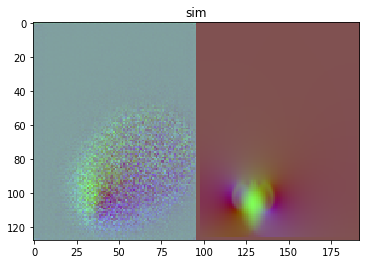

In [ ]:
outGif = '{}.gif'.format(versionName)
create_movie(Xrgb.detach().numpy(),outfile=outGif)

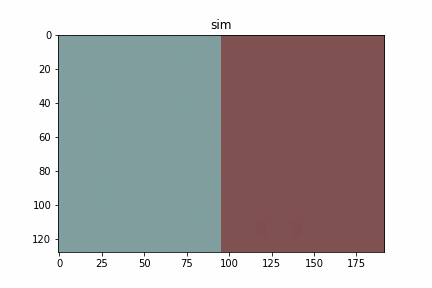

In [ ]:
from IPython.display import Image
Image(filename=outGif)

### Visualize Train simulation

In [ ]:
#simData = getSingleSim(sim=simVizIndex,dataDirec=trainData)
simDataset = MantaFlowDataset(trainData, reverseXY=reverseXY, numToKeep=numSamplesToKeep, AE=False)
simDataLoader = DataLoader(simDataset,batch_size=1)

100%|██████████| 32/32 [00:00<00:00, 486.09it/s]


In [ ]:
XX = []
Real_X = []
model.eval()
for i, sampleBatch in enumerate(simDataLoader,start=1):
    with torch.no_grad():
        X,p = sampleBatch
        X = X.to(device)
        p = p.to(device)
        Real_X.append(X)
        
        X_hat,_ = model(X)
        
        if createStreamFcn:
            X_hat = stream2uv(X_hat,device)
            
        XX.append(X_hat)
        
        #X = X.detach().cpu().squeeze()
        #X_hat = X_hat.detach().cpu().squeeze()
        #plotSampleWprediction(X, X_hat)

Real_X = torch.cat(Real_X,axis=0).to('cpu')
Real_X_img = convertSimToImage(Real_X)

Surr_X = torch.cat(XX,axis=0).to('cpu')
Surr_X_img = convertSimToImage(Surr_X)

### Metrics

In [ ]:
rmse(Real_X,Surr_X)

tensor(0.0215)

In [ ]:
rel_error = torch.norm(Real_X - Surr_X)/torch.norm(Real_X)
rel_error

tensor(0.9398)

### Make Movie

In [ ]:
Xrgb = torch.cat([Real_X_img, Surr_X_img], dim=3)
Xrgb.shape

torch.Size([32, 3, 128, 192])

MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


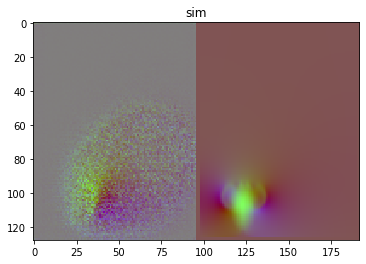

In [ ]:
outGif = '{}.gif'.format(versionName)
create_movie(Xrgb.detach().numpy(),outfile=outGif)

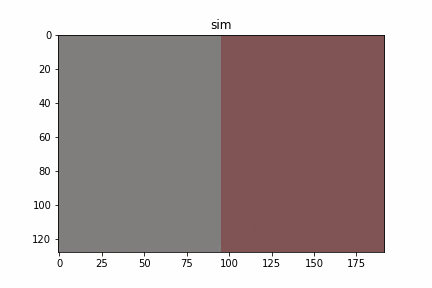

In [ ]:
from IPython.display import Image
Image(filename=outGif)